# Tutorial: Linear Algebra in Julia
#### Samantha Fairchild: Max Planck Institute for Mathematics in the Sciences

Instructions for Installing Julia, and access to download the worksheet:

https://github.com/skfairchild/WiDS_LATutorial

What is Julia?
A highly efficient, open source language with an emphasis on mathematical libraries and data manipulation tools

https://julialang.org/

### 0.1 Installing and Using packages

In [1]:
using Pkg;
Pkg.add("Plots");
Pkg.add("LinearAlgebra")

    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`


In [2]:
using Plots
using LinearAlgebra

## 1. How to work with Matrices and Graphs in Julia

In [3]:
Pkg.add("Graphs")
Pkg.add("SparseArrays")
Pkg.add("GraphPlot")
using Graphs, SparseArrays, GraphPlot

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`


**Definition** A graph $G=(V,E)$ is a pair consisting of a finite number of *vertices* given by $$V = \{1,\ldots, n\}$$ and a finite number of edges between pairs of vertices $$E \subseteq \{\{i,j\}: i,j \in V, i\neq j\}.$$

**Construction**
One way to construct a random simple grpah is to use the Graphs package and the Command Simple Graph:

    SimpleGraph{T}(nv, ne; ; rng=nothing, seed=nothing)

Construct a random $SimpleGraph\{T\}$ with $nv$ vertices and $ne$ edges. The graph is sampled uniformly from all such graphs. If $seed \geq 0$, a random generator is seeded with this value. If not specified, the element type $T$ is the type of $nv$. 

[When in doubt refer to the manuals for examples and explanations](https://juliagraphs.org/Graphs.jl/dev/)

In [4]:
nv = 5 #select number of vertices
ne = 8 #select number of edges
g= SimpleGraph(nv, ne) #Construct random simple graph with nv vertices and ne edges

{5, 8} undirected simple Int64 graph

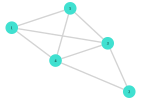

In [5]:
P1 = gplot(g, nodelabel = 1:nv) #basic plot of the graph

**Question:** What are some real-life situations that can be represented by graphs?

**Answers**

**A note on terminology** For this section we will be working with simple undirected graphs.

An *Directed Graph* allows for orderd edges $(i,j) \in E$ when $(j,i)\notin E$. The notation $\{i,j\}$ implies an unordered set, making an *undirected graph*

A *simple graph* does not allow self-loops, so we cannot have an edge connecting vertex $i$ to itself.

**Associating a Matrix to a Graph: The Adjacency Matrix**

When $v \in V$ and $e = \{u,v\} \in E$ for some $u\in V$, we say that $u$ is *adjacent* to $v$.

The *Adjacency Matrix* of $G$ is a $|V|\times |V|$ matrix where the $i,j$ entry is given by 
$$a_{ij} = \begin{cases} 1 & \{i,j\}\in E\\ 0 & \text{ othewise}\end{cases}.$$

*Recall i is the row of $A$ and $j$ is the given column.*

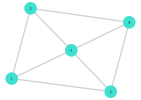

In [6]:
nv = 5 #select number of vertices
ne = 8 #select number of edges
g= SimpleGraph(nv, ne) #Construct random simple graph with nv vertices and ne edges
P1 = gplot(g, nodelabel = 1:nv) #basic plot of the graph

In [7]:
A= sparse(g) #Construct the adjacency matrix of the graph, sparse meanse we don't keep track of zeros

5×5 SparseMatrixCSC{Int64, Int64} with 16 stored entries:
 ⋅  1  1  ⋅  1
 1  ⋅  1  1  ⋅
 1  1  ⋅  1  1
 ⋅  1  1  ⋅  1
 1  ⋅  1  1  ⋅

**Using a theorem on counting walks**

A *walk* in $G$ of length $D$ is a sequence of vertices 
$$P = (v_0,v_1,\ldots, v_D)$$
so that $\{v_i, v_{i+1}\} \in E$

**Theorem** Let $A$ be the adjacenty matrix of a graph $G = (V,E)$, and let $v,w \in V$. Then the number of walks from $v$ to $w$ of length $k$ is given by $$(A^k)_{v,w}$$


In [8]:
A^3

5×5 SparseMatrixCSC{Int64, Int64} with 25 stored entries:
 4  8  8  4  8
 8  4  8  8  4
 8  8  8  8  8
 4  8  8  4  8
 8  4  8  8  4

Definition: A graph is connected if for every $v,w \in V$ there is a walk from $v$ to $w$ in $G$.

**Corollary** A graph is connected if and only if for every $v,w$ there is some $k$ so that $(A^k)_{v,w} > 0$.

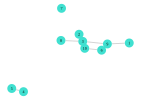

In [9]:
nv = 10 #select number of vertices
ne = 8 #select number of edges
g= SimpleGraph(nv, ne) #Construct random simple graph with nv vertices and ne edges
A= sparse(g)
P1 = gplot(g, nodelabel = 1:nv) #basic plot of the graph


In [10]:
A^5

10×10 SparseMatrixCSC{Int64, Int64} with 26 stored entries:
  ⋅   7   ⋅  ⋅  ⋅   ⋅  ⋅   7  15  12
  7   ⋅  21  ⋅  ⋅  13  ⋅   ⋅   ⋅   ⋅
  ⋅  21   ⋅  ⋅  ⋅   ⋅  ⋅  21  41  34
  ⋅   ⋅   ⋅  ⋅  1   ⋅  ⋅   ⋅   ⋅   ⋅
  ⋅   ⋅   ⋅  1  ⋅   ⋅  ⋅   ⋅   ⋅   ⋅
  ⋅  13   ⋅  ⋅  ⋅   ⋅  ⋅  13  27  22
  ⋅   ⋅   ⋅  ⋅  ⋅   ⋅  ⋅   ⋅   ⋅   ⋅
  7   ⋅  21  ⋅  ⋅  13  ⋅   ⋅   ⋅   ⋅
 15   ⋅  41  ⋅  ⋅  27  ⋅   ⋅   ⋅   ⋅
 12   ⋅  34  ⋅  ⋅  22  ⋅   ⋅   ⋅   ⋅

## 2. Buliding the Laplace Matrix

We now want to build a matrix which has the information on the Adjacency matrix, as well as information about the number of connecting edges called the degree.

**Definition** Let $G = (V,E)$ be a graph. The degree of a vertex $v\in V$ is the number of vertices adjacent to $v$ denoted by 
$$\mathrm{deg}(v) = \#\{u\in V| \{u,v\}\in E\}.$$

The **(normalized) Laplace matrix** of $G$ is $$L$$ where
$$\ell_{ij} = \begin{cases} 1 & i = j\\ \frac{-1}{\sqrt{\deg(i)\deg(j)}} & i\neq j \text{ and } \{i,j\}\in E\\ 0 & \text{otherwise} \end{cases}$$

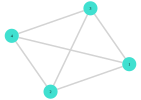

In [11]:
nv = 4 #select number of vertices
ne = 6 #select number of edges
g= SimpleGraph(nv, ne) #Construct random simple graph with nv vertices and ne edges
A= sparse(g)
P1 = gplot(g, nodelabel = 1:nv) #basic plot of the graph

In [12]:
d = Graphs.degree(g) #degree function for a graph
L = zeros(nv, nv) #Construct the Laplace matrix
for i in 1:nv
    for j in 1:nv
        if i == j ## 1 if i=j
            L[i,j] = 1
        elseif A[i,j] == 1 ## if the adjacency matrix is not zero, then there is an edge
            L[i,j] = - 1 / sqrt(d[i] * d[j])
        end
    end
end
L

4×4 Matrix{Float64}:
  1.0       -0.333333  -0.333333  -0.333333
 -0.333333   1.0       -0.333333  -0.333333
 -0.333333  -0.333333   1.0       -0.333333
 -0.333333  -0.333333  -0.333333   1.0

**Computing the spectrum of a graph**

Recall the eigenvalues tell us the amout of stretching in the direciton of an eigenvector. There are always $|V|$ eigenvalues associated to a graph $G= (V,E)$
$$0 =\lambda_0 \leq \lambda_1\leq \cdots \leq \lambda_{|V|-1}$$

In [13]:
E = eigvals(L)

4-element Vector{Float64}:
 1.2952601953960158e-16
 1.3333333333333335
 1.3333333333333335
 1.3333333333333335

**Detecting Geometry of a graph from the spectrum of a graph**

**Theorem** Let $G = (V,E)$ be a graph with $n = |V|\geq 2$ and let
$$0 = \lambda_0\leq \lambda_1\leq \cdots \leq \lambda_{n-1}.$$
Then $\lambda_i = 0$ and $\lambda_{i+1} >0$ if and only if $G$ has exactly $i+1$ connected components.


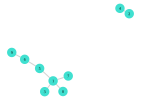

In [17]:
nv = 9 #select number of vertices
ne = 7 #select number of edges
g= SimpleGraph(nv, ne) #Construct random simple graph with nv vertices and ne edges
A= sparse(g)
d = Graphs.degree(g) #degree function for a graph
L = zeros(nv, nv) #Construct the Laplace matrix
for i in 1:nv
    for j in 1:nv
        if i == j ## 1 if i=j
            L[i,j] = 1
        elseif A[i,j] == 1 ## if the adjacency matrix is not zero, then there is an edge
            L[i,j] = - 1 / sqrt(d[i] * d[j])
        end
    end
end
P1 = gplot(g, nodelabel = 1:nv) #basic plot of the graph

In [18]:
E = eigvals(L)

9-element Vector{Float64}:
 0.0
 5.247430417507711e-17
 0.20943058495790523
 0.9999999999999993
 0.9999999999999998
 1.0
 1.7905694150420952
 1.9999999999999996
 2.0

## 3. Component Analysis in Social Networks

In [23]:
Pkg.add("Cairo")
Pkg.add("Colors")
Pkg.add("Compose")
Pkg.add("Fontconfig")
Pkg.add("Twitter")
Pkg.resolve()

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`


In [24]:
using Twitter, Graphs, GraphPlot, SparseArrays, LinearAlgebra, Colors, Plots 
using Compose, Fontconfig, Cairo;

# Loading the Data

First we load the data.

There are two options in this notebook. 

For Option 1, we need a Twitter account.

For Option 2, we do not need a Twitter account.


## Option 1: Load Data from Twitter

To do this, we must authenticate on twitter 

In the Twitter [Developer Portal](https://developer.twitter.com/en) a new application has to be created.

There the following can be created: `CONSUMER_KEY`, `CONSUMER_SECRET`, `ACCESS_TOKEN` und `ACCESS_TOKEN_SECRET`.

See also [Dokumentation des Twitter.jl Packages](https://github.com/randyzwitch/Twitter.jl)



In [79]:
CONSUMER_KEY = "";
CONSUMER_SECRET = "";
ACCESS_TOKEN = "";
ACCESS_TOKEN_SECRET = "";

###We load the last 500 tweets containing the Hashtag `#DataScience`.
#twitterauth(CONSUMER_KEY, CONSUMER_SECRET, ACCESS_TOKEN, ACCESS_TOKEN_SECRET)
#twitterauth(CONSUMER_KEY, CONSUMER_SECRET, ACCESS_TOKEN, ACCESS_TOKEN_SECRET);
#tweets = get_search_tweets(q = "#DataScience", count = 500)
#T = tweets["statuses"];
###We can display the last of these tweets as follows.
#println(T[1].user["screen_name"])
#println(T[1].text)
###We want to analyze the hashtags in the tweets. To do that, we make a list of lists, where the $i$th list contains the hastags of the $i$th tweet.
#hashtags = Vector{Vector{String}}()
#for (i,t) in enumerate(T)
#    push!(hashtags, Vector{String}())
#    for entry in t.entities["hashtags"]
#        push!(hashtags[i], entry["text"])
#    end
#end
#filter!(x -> !isempty(x), hashtags)
#hashtags[1:5]


## Option 2: Load data from a .txt file.


We can load old data from a `.txt` file (This data was generated on 22.04.2022).

In [25]:
hashtags = Vector{Vector{String}}()
open("hashtags.txt") do f
    i = 0
    for ln in eachline(f)
        if ln == ""
            push!(hashtags, Vector{String}())
            i+=1
        else
            push!(hashtags[i], ln)
        end
    end
end
hashtags[1:5]

5-element Vector{Vector{String}}:
 ["100Daysofcode", "javascript", "programming", "dev", "linux", "java", "programming", "CodeNewbie"]
 ["100Daysofcode", "javascript", "programming", "dev", "linux", "java", "programming", "CodeNewbie"]
 ["100Daysofcode", "javascript", "programming", "dev", "linux", "java", "programming", "CodeNewbie"]
 ["javascript", "programming", "dev", "linux", "java", "programming", "CodeNewbie", "python"]
 ["javascript", "programming", "dev", "linux", "java", "programming", "CodeNewbie", "python"]

## Prepare Data
We create an array of `unique_hashtags`, which lists all hashtags in a single list.

In [26]:
all_hashtags = vcat(hashtags...)
unique_hashtags = unique(all_hashtags)

171-element Vector{String}:
 "100Daysofcode"
 "javascript"
 "programming"
 "dev"
 "linux"
 "java"
 "CodeNewbie"
 "python"
 "100DaysOfCode"
 "WomenWhoCode"
 "Programming"
 "DataScience"
 "AcademicTwitter"
 ⋮
 "TidyTuesday"
 "tidyverse"
 "Roadmap"
 "FreePython"
 "ecommerce"
 "AR"
 "SQL"
 "Cloud"
 "genomic"
 "Gladiator"
 "Jeep"
 "intoAInews"

# Definition of the graph

We create a network from the data.

The vertices of the graph are the hashtags.

We define an edge between two vertices whenever two hashtags appear together in the same tweet.

We first calculate the adjacency matrix

In [27]:
n = length(unique_hashtags)
A = zeros(Int, n, n)

function edge(hᵢ, hⱼ)
    for h in hashtags
        if hᵢ in h && hⱼ in h
            return 1
        end
    end
    return 0
end
    
    
for i in 2:(n-1)
    hᵢ = unique_hashtags[i]
    for j in (i+1):n
        hⱼ = unique_hashtags[j]
        A[i,j] = edge(hᵢ, hⱼ)
    end
end    
A = sparse(max.(A, A'))

171×171 SparseMatrixCSC{Int64, Int64} with 1528 stored entries:
⣾⣿⣀⡀⠀⠀⠀⣃⣀⡀⠀⠐⣛⡃⠀⠀⠀⠀⠀⠀⢀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠸⣿⣻⣛⣓⣒⠁⠀⠀⠀⠀⣟⡚⠛⠀⣃⢚⠃⠀⠘⠀⠂⠀⠀⠃⣒⣢⡔⠓⠒⠒⠂⠀⠐⡂⠒⢒⢘⠀
⠀⠀⢿⢸⣿⣿⡏⠃⠀⠀⠀⠀⠿⠐⠒⠀⠇⠹⠛⠉⠁⠈⠀⠀⠀⠀⠀⠀⠈⠁⠒⠒⠀⠀⠀⠈⠁⠀⠹⠀
⠤⢠⠜⠘⠯⠉⠚⣤⣤⡄⠀⠠⠧⠄⠀⠀⠁⠀⡤⡖⠂⠘⠃⠀⢠⣤⠀⠠⠀⠄⠀⠀⠀⠠⠤⠘⠀⠀⠃⠠
⠀⠸⠀⠀⠀⠀⠀⠿⠿⢇⣀⠀⠀⠀⠀⠀⠀⠀⠁⠁⠀⠀⠀⠀⠈⠉⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⢀⠀⠀⠀⠀⠀⠀⡀⠀⠘⠛⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⣀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠿⠸⣻⠹⢛⠃⠉⠇⠀⠀⠀⠀⡾⢏⣉⠁⠃⠙⠁⠈⠀⠉⠁⠀⠀⠁⠉⠉⠉⠉⠉⠉⠀⠀⠀⠀⠀⠀⠘⠀
⠀⠀⠛⠀⠘⠀⠀⠀⠀⠀⠀⠀⠇⠘⠫⢆⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⣩⢘⣍⡁⠁⠀⠀⠀⠀⠀⣍⠀⠀⠀⡾⣫⠁⢀⠀⣀⠀⠀⠀⠀⣀⠀⢀⡀⠉⠉⠀⠀⠀⠀⠀⠀⢈⠀
⠀⠀⠉⠀⡟⠀⢠⠯⠅⠀⠀⠀⡁⠀⠀⠀⠁⢀⠏⣡⡄⣄⠀⠀⠨⢭⠀⠀⠀⠁⠉⠉⠀⠀⠀⣤⠀⠀⠀⠀
⠀⠐⠒⠀⡁⠀⣈⠀⠀⠀⠀⠀⡄⠀⠀⠀⠀⢠⠀⢭⠁⣤⠀⠀⠀⠠⠀⠀⠀⠀⠀⠀⠀⠀⠀⢤⠀⠀⡀⠀
⠀⠀⠈⠀⠀⠀⠉⠀⠀⠀⠀⠀⠁⠀⠀⠀⠀⠀⠀⠀⠀⠀⢱⣶⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠤⠀⠀⠀⠀⣶⡆⠀⠀⠘⠄⠀⠀⠀⠀⠀⡆⣆⠀⡀⠀⠀⢪⣶⠀⢀⠀⠤⠄⠀⠀⢀⣠⣀⠀⠀⠀⠤
⠀⠀⠸⣸⠀⠀⠀⡀⠀⠀⠀⠀⡇⠀⠀⠀⠀⠘⠀⠀⠀⠀⠀⠀⠀⢀⠛⠀⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⢴⠉⠆⠀⠀⠄⠀⠀⠀⠀⡇⠀⠀⠀⠀⠰⠄⠀⠀⠀⠀⠀⠀⡄⠀⠈⠰⢂⡀⠀⠀⠀⢀⠀⠀⠀⠀⣀
⠀⠀⢸⠀⢸⠀⠀⠀⠀⠀⠀⠀⡇⠀⠀⠀⡇⠀⡇⠀⠀⠀⠀⠀⠀⠁⠀⠀⠀⠈⣾⣿⠀⠀⠈⠀⠀⠀⠀⠀
⠀⠀⠈⠀⠀⠀⠀⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⢀⠀⠀⠀⠀⠀⠀⠱⠆⣀⠀⠀⠀⠀⠀
⠀⠀⠰⠠⡀⠀⣀⠃⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⣤⠀⣄⠀⠀⠀⢺⠀⠀⠀⠐⠂⠀⠀⠘⠋⣠⠀⠀⡀⠀
⠀⠀⢸⢀⠁⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠿⠇⠀⠀
⠀⠀⠒⠐⠓⠂⠉⡀⠀⠀⠀⠀⠒⠀⠀⠀⠂⠐⠀⠀⠀⠈⠀⠀⠀⡄⠀⠀⠀⢠⠀⠀⠀⠀⠀⠈⠀⠀⠑⡠

The Adjacency matrix `A` defines the graph `G`.

In [28]:
G = Graphs.Graph(A)

{171, 764} undirected simple Int64 graph

We remove all degree zero vertices from the graph.

In [29]:
d = Graphs.degree(G)
not0 = findall(d .!= 0)

unique_hashtags = unique_hashtags[not0]
A = A[not0,not0]
d = d[not0]

n = length(unique_hashtags)
G = Graphs.Graph(A)

{162, 764} undirected simple Int64 graph

# Visualization

We visualize the graph as follows.

We plot the labels of the vertices with the 5 highest degrees.

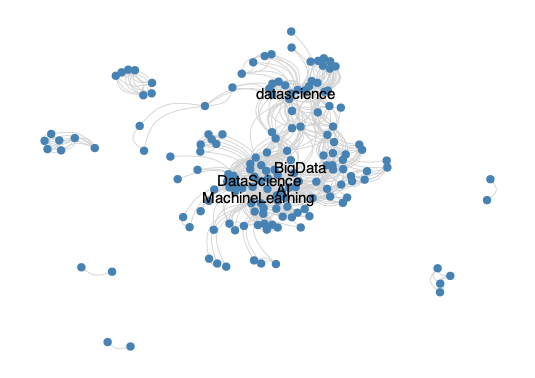

In [30]:
c = sortperm(d, rev = true)[1:5]
labels = ["" for _ in 1:n]
labels[c] = unique_hashtags[c] 
layout= spring_layout(G; C=5)
P1 = gplot(G, layout...;
        linetype="curve", 
        nodelabel=labels,
        nodelabeldist=2,
        nodefillc = colorant"steelblue"
)

---
# The Laplace Matrix

We compute the Laplace matrix `L` of `G`.

In [31]:
L = zeros(n, n)
for i in 1:n
    for j in 1:n
        if i == j
            L[i,j] = 1
        elseif A[i,j] == 1
            L[i,j] = - 1 / sqrt(d[i] * d[j])
        end
    end
end
L;

We can then compute the eigenvalues of `L` as follows:

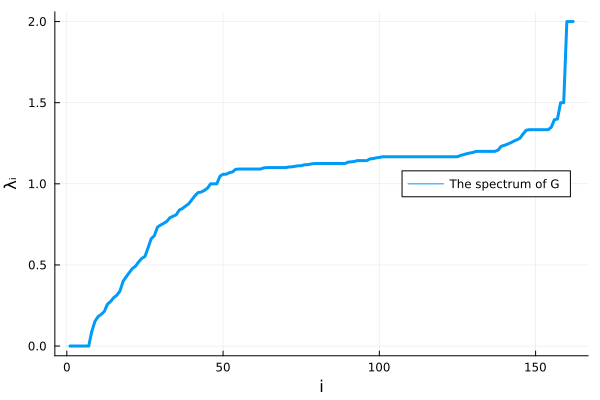

In [32]:
E = eigen(L)
λ = E.values
P2 = plot(λ, label = "The spectrum of G", 
             legend = 0,
             linewidth = 3,
             xlab = "i",
             ylab = "λᵢ")

The number of components is equal to the dimension of the kernel of `L`, that is the number of zero eigevalues in the spectrum.

In [33]:
n_components = count(λ .< 1e-14)

7

In [34]:
C = connected_components(G)

7-element Vector{Vector{Int64}}:
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10  …  153, 154, 155, 156, 157, 158, 159, 160, 161, 162]
 [40, 41, 42, 43, 44, 45, 46]
 [47, 48]
 [66, 67]
 [72, 73]
 [94, 95, 96, 97, 98, 99, 100]
 [134, 135, 136, 137]

---
# Analysis of a component

We now analyze the largest connected component `H` of `G`

We will also compute the connected components.

In [35]:
k = findmax(length.(C))
I = C[k[2]];
H = Graph(A[I, I])

{138, 713} undirected simple Int64 graph

We next plot this component

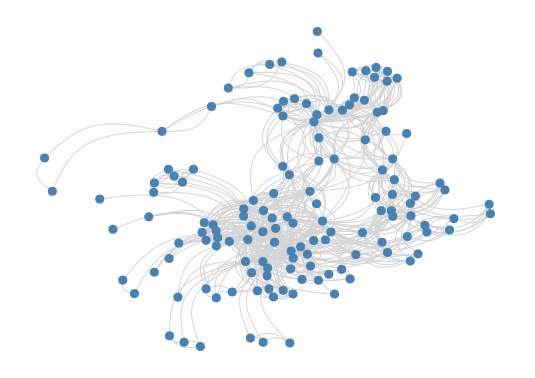

In [36]:
layout_H = (layout[1][I], layout[2][I])
P3 = gplot(H, layout_H...;
        linetype="curve", 
        nodelabeldist=2,
        nodefillc = colorant"steelblue"
)

Next we compute the spectrum of `H`.

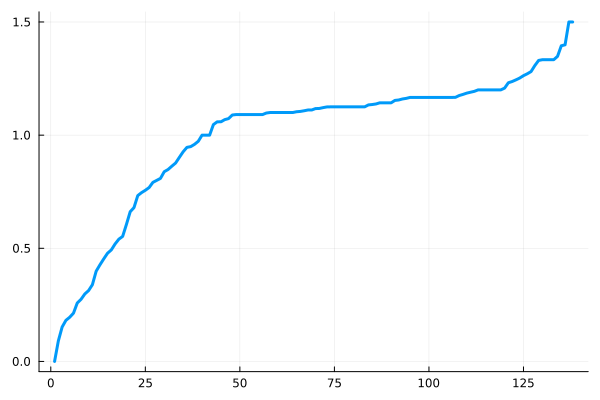

In [37]:
L_H = L[I,I]
E_H = eigen(L_H)
λ_H = E_H.values
P4 = plot(λ_H, legend = false, linewidth = 3)

Now let `w` be an eigenvector of $\lambda_1$, which is the first nonzero eigenvalue.

We color the vertices red or blue depending on the sign of `w`. We color the vertex yellow in the case that value of `w` is zero.

This shows us the components of `H` that are *most* connected.

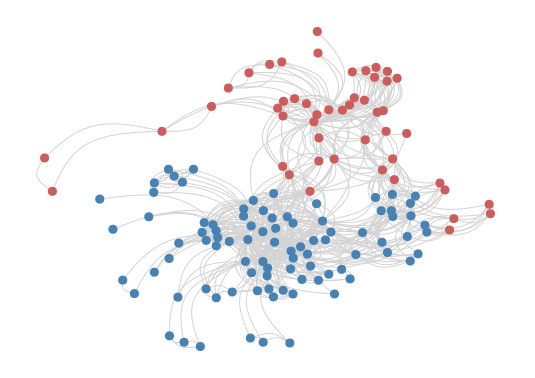

In [38]:
w = E_H.vectors[:,2]
cols = []
for wᵢ in w
    if abs(wᵢ) > 1e-12 
        if wᵢ < 0
            push!(cols, colorant"steelblue")
        else
            push!(cols, colorant"indianred")
        end
    else
        push!(cols, colorant"orange")
    end
end
layout= x -> spring_layout(x; C=5)
P5 = gplot(H, layout_H...;
        linetype="curve", 
        nodelabeldist=2,
        nodefillc = cols
)

The labels of the two clusters are as follows:

In [39]:
unique_hashtags[I][w .> 0]

49-element Vector{String}:
 "javascript"
 "programming"
 "dev"
 "linux"
 "java"
 "CodeNewbie"
 "python"
 "100DaysOfCode"
 "datascience"
 "capgemini"
 "ai"
 "sql"
 "worklifesuccess"
 ⋮
 "pythonbot"
 "Automotive"
 "Infographic"
 "MinimumViableProduct"
 "MVP"
 "automation"
 "built"
 "Cryptos"
 "TechForGood"
 "Gladiator"
 "Jeep"
 "intoAInews"

In [40]:
unique_hashtags[I][w .< 0]

89-element Vector{String}:
 "WomenWhoCode"
 "Programming"
 "DataScience"
 "AcademicTwitter"
 "JOB"
 "ArtificialIntelligence"
 "MachineLearning"
 "Python"
 "infographic"
 "BigData"
 "Analytics"
 "IoT"
 "IIoT"
 ⋮
 "Rstats"
 "ggplot2"
 "Datavisualization"
 "dataviz"
 "TidyTuesday"
 "tidyverse"
 "Roadmap"
 "FreePython"
 "ecommerce"
 "AR"
 "SQL"
 "Cloud"

Next we color similarly for the largest eigenvalue.

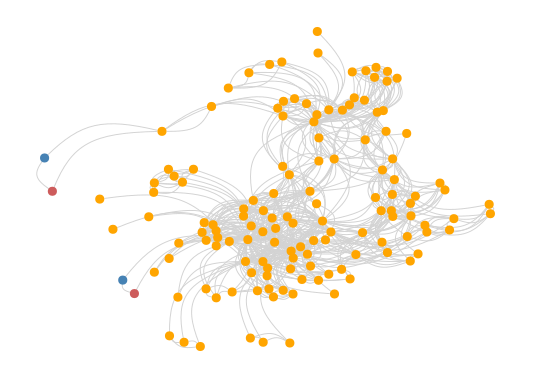

In [42]:
u = E_H.vectors[:,end]
cols = []
for uᵢ in u
    if abs(uᵢ) > 1e-12 
        if uᵢ < 0
            push!(cols, colorant"steelblue")
        else
            push!(cols, colorant"indianred")
        end
    else
        push!(cols, colorant"orange")
    end
end
P6 = gplot(H, layout_H...;
        linetype="curve", 
        nodelabeldist=2,
        nodefillc = cols
)

In [43]:
unique_hashtags[I][u .> 1e-12], unique_hashtags[I][u .< -1e-12]

(["university", "CheatSheet"], ["maths", "Linux"])

Finally the plots can be saved as follows:

In [44]:
draw(PDF("plot.pdf", 16cm, 16cm), P1)

## 4. Page Rank in Airport Networks

In [45]:
using CSV, JSON
using DataFrames, Graphs, GraphPlot, Colors
using SparseArrays, LinearAlgebra, Plots, FileIO
using VegaLite, VegaDatasets

We load the data set `flights-airport`:

In [47]:
flights= CSV.read("flights-airport.csv", DataFrame)

,origin,destination,count
,String3,String3,Int64
1,ABE,ATL,853
2,ABE,BHM,1
3,ABE,CLE,805
4,ABE,CLT,465
5,ABE,CVG,247
6,ABE,DTW,997
7,ABE,JFK,3
8,ABE,LGA,9
9,ABE,ORD,1425


The first 8 lines of these `DataFrames` are as follows:

In [48]:
flights[1:8,:]

,origin,destination,count
,String3,String3,Int64
1,ABE,ATL,853
2,ABE,BHM,1
3,ABE,CLE,805
4,ABE,CLT,465
5,ABE,CVG,247
6,ABE,DTW,997
7,ABE,JFK,3
8,ABE,LGA,9


We extract the Airport IDs in an array `airports`.

In [49]:
list_airports = vcat(flights[:,:origin],flights[:,:destination])
airports = unique(list_airports)
airports[1:5]
length(airports)

305

# Definition of the Graph

Next we compute the Adjacency matrix `A`.

In [50]:
# build the adjacency matrix
n = length(airports)
A = spzeros(n,n)
for k = 1:size(flights, 1)
    i = findfirst(airports .== flights[k,:origin])
    j = findfirst(airports .== flights[k,:destination])
    A[i,j] = 1
end
A = max.(A,A')

305×305 SparseMatrixCSC{Float64, Int64} with 5668 stored entries:
⠀⠀⣾⠀⠁⡂⡂⠄⡋⢚⢚⣊⢒⢀⠀⠀⠀⢒⠀⢸⡒⡍⠐⣒⠈⠠⡒⢚⢚⠀⠀⠀⠐⡰⠰⠖⠀⡒⠀⠀
⠚⠛⢾⠓⠲⡚⡖⠓⠖⢺⢻⢻⢺⡶⠂⠗⠒⠿⠖⣺⣿⠖⠒⠶⠶⡚⡟⠻⢿⠒⠰⠗⢞⢛⢺⡒⠲⠞⠒⠆
⠡⠠⣸⠢⠪⠂⢧⠰⠷⢺⢹⠸⢸⠰⠲⠢⠁⣻⠄⠸⠷⠇⠒⢿⠾⠀⡷⢻⠾⠇⠸⠷⠴⡸⢺⠸⠤⠇⠂⠁
⠈⠌⢼⠉⢉⡓⠁⠀⡉⢸⢹⣸⢘⡘⠀⠈⠂⢹⡋⢉⠻⡋⠈⢻⢉⢀⡋⢹⠉⠉⠉⠉⢋⢸⠼⠉⠐⠋⠀⠆
⣫⢈⣸⣁⣹⣃⣃⣈⣏⣹⣹⣹⣘⢍⡀⣚⠀⣼⡇⣘⣿⣯⢸⣻⣻⢈⡏⣿⣻⡍⢌⣋⣫⣨⣸⣝⢙⣋⣁⡄
⡺⢰⣿⣒⣓⡒⣓⣲⣗⣺⣺⣺⣛⢒⡒⣖⠒⣻⣂⣒⣻⣿⢚⣳⣺⢲⡗⣿⣲⡒⢒⣖⣚⣐⣲⢚⣐⣛⡒⡒
⠘⢐⢺⡶⢒⡒⣒⠰⡖⢜⢻⢘⢄⠑⠀⡒⠐⣛⣂⢒⣿⡖⢰⣚⣳⠰⣆⢿⢻⣃⣖⣓⡺⢾⢸⢺⢒⡚⠆⠦
⠀⠀⢬⠄⠸⡂⡀⠀⣠⢨⢸⢬⢠⠠⠄⠁⠤⢠⠀⢀⠳⡃⠀⣩⣨⠨⡗⢾⢺⠄⠄⡖⠑⠸⠹⠂⠀⠽⠀⠄
⢠⢀⣼⡄⣥⣠⣌⣀⣀⣤⣼⣠⣴⢠⠀⣃⢀⣴⡀⣼⣤⣢⣠⣤⣀⡀⣧⣼⣤⣄⣀⣀⣤⢠⣸⣤⣀⣤⣀⡀
⣀⣀⣸⣡⣀⡁⡏⢈⣉⢩⢨⢸⢨⢘⠀⢀⣀⣬⡄⣩⣻⣁⢉⣿⡉⠀⣧⣩⣊⡁⣄⣁⣋⢈⣩⣈⣀⣃⡀⡃
⡜⠬⢻⠟⠽⠇⡿⠢⡿⣿⣿⣾⢻⠿⠽⠢⠠⣻⠟⢺⣎⠝⢘⣿⡿⠺⣿⣿⣿⠇⠋⠿⢿⢻⢻⣿⠄⠿⠬⠇
⢰⢠⢸⡄⣼⣄⣦⣀⣶⣲⢾⣰⣰⢲⡄⣠⠀⣾⣧⣴⣶⣴⢠⡶⣶⣐⣗⣾⣶⣦⢤⣦⣶⢰⣸⣲⠠⣶⣆⡀
⠂⡀⣸⠣⠚⠃⠃⢐⡛⢚⢺⣚⢙⡚⡂⡚⠀⠸⠃⠈⣻⡋⢘⢻⢔⠑⡇⣾⣙⡃⠈⣫⢛⣹⢘⠘⠁⢓⠁⠁
⣸⢈⣿⡉⣽⣋⣏⣈⣯⣭⣽⣭⣬⣝⣹⣍⣉⣿⡍⣻⣿⣿⣹⣽⣩⣭⣵⣿⣿⣁⣍⣹⣹⣹⣹⣯⣈⣹⣁⡁
⠚⠐⢻⠓⠾⠇⡇⠀⡟⠾⢸⠺⠿⢲⠚⠖⠀⢿⠎⠸⠿⠟⠸⣿⠷⠸⠟⢻⠾⠃⠓⠻⠟⢺⢼⠓⠚⡗⡀⠂
⠀⠀⢴⠆⢶⡆⡇⠀⡦⢱⢸⢴⢼⢹⢠⠥⠀⢸⠄⢹⣯⡄⠠⣷⡦⣠⣇⣹⣽⡀⠀⡠⢰⢸⢹⡢⠀⢎⠋⠄
⢐⡠⣾⢑⣐⡣⣋⣐⡋⣺⢚⢸⣺⣎⣑⡀⠀⣛⡋⢘⣿⣓⢘⣛⣟⣰⣗⣺⣻⣁⣐⣒⢰⣲⣰⣚⠀⣓⡀⠀
⢰⠆⢺⠲⣚⡒⡖⠃⣖⢾⣸⢚⣲⣒⠳⠂⠒⣾⡃⢺⣿⣶⢲⣺⣒⠐⡷⣾⢶⠓⠳⡲⣰⢺⣺⣾⠂⣲⠗⠓
⢠⠠⣸⠆⠤⠇⡴⠀⡷⢰⣴⢸⣸⠰⣄⡄⠀⣼⠤⢸⣤⡅⢠⣦⢥⢀⣆⣸⢾⠤⡠⢄⢤⢠⢨⣠⠠⠆⠁⡀
⠀⠀⠸⠄⠌⠀⠠⠄⠁⠼⢸⠨⠨⡅⠀⠄⠀⠸⠤⠨⠦⠇⠈⠹⠅⠀⠅⠸⠠⠈⠋⠄⠀⠈⢽⠁⠁⠠⠀⠀

The graph `G` is defined by the matrix `A`.

In [51]:
G = Graph(A)

{305, 2834} undirected simple Int64 graph

# Visualization

We look at a visualization of the graph

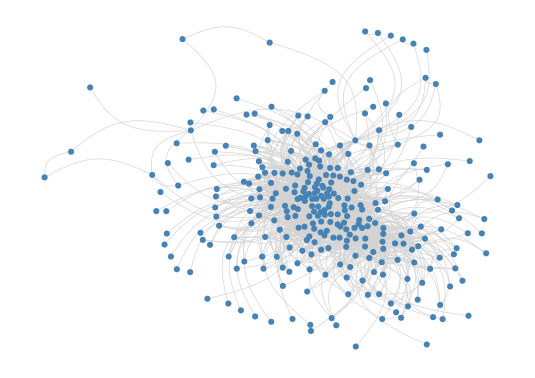

In [52]:
layout= x -> spring_layout(x; C=5)
gplot(G, layout = layout,
        nodefillc = colorant"steelblue",
        linetype="curve"
)

It seems that the distribution of degrees of the blue nodes is not even. This is confirmed by the following plots.

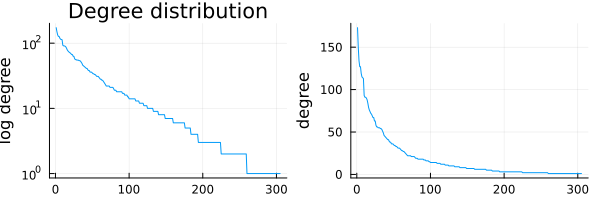

In [53]:
degrees = degree(G)
p1 = plot(sort(degrees,rev=true), ylabel="log degree", legend=false, yaxis=:log, title="Degree distribution")
p2 = plot(sort(degrees,rev=true), ylabel="degree", legend=false)
plot(p1, p2, size=(600,200))

# Geographical Visualization

The first visualization lookd at `G` as a graph without any further structure.

The vertices in `G` can be identified with points in $\mathbb R^2$.

We can represent this structure visually as follows.

First we load a data set providing the lattitude and longitude of the airports.

In [54]:
#all_locations = dataset("airports") |> DataFrame
all_locations = CSV.read("airports.csv", DataFrame)
k = [id in airports for id in all_locations[:,:iata]]
locations = all_locations[k,:]
locations[1:5,:]

,iata,name,city,state,country,latitude
,String7,String,String,String3,String31,Float64
1,ABE,Lehigh Valley International,Allentown,PA,USA,40.6524
2,ABI,Abilene Regional,Abilene,TX,USA,32.4113
3,ABQ,Albuquerque International,Albuquerque,NM,USA,35.0402
4,ABY,Southwest Georgia Regional,Albany,GA,USA,31.5355
5,ACK,Nantucket Memorial,Nantucket,MA,USA,41.2531


With the help of the package `VegaLite` we can visualize the graph:

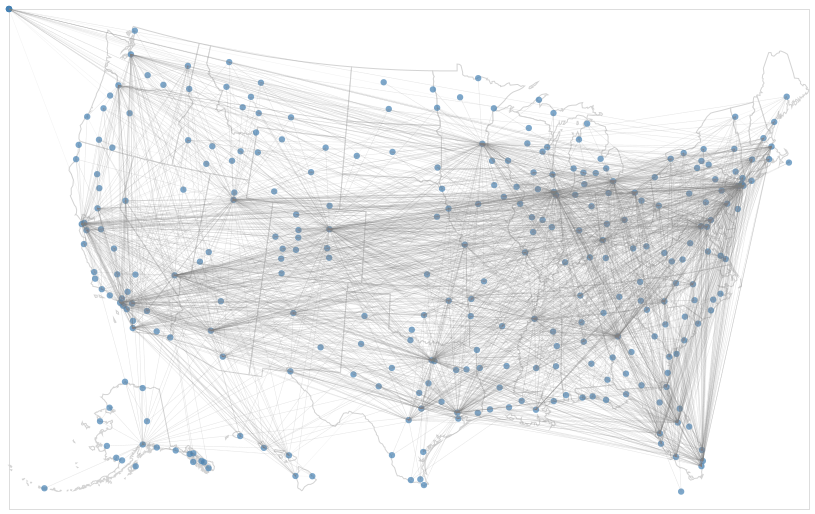

In [55]:
us10m = dataset("us-10m")


P1 = @vlplot(width=800, height=500) +
@vlplot(
    mark={:geoshape, fill=:white, stroke=:lightgray},
    data={values=us10m, format={type=:topojson,feature=:states}},
    projection={type=:albersUsa}) +
@vlplot(
    :circle,
    data=locations, projection={type=:albersUsa}, 
    longitude="longitude:q", latitude="latitude:q", 
    size={value=40}, color={value=:steelblue})+
@vlplot(
    mark={:rule, strokeWidth = 0.5, opacity=0.1,  color = "grey"},
    data=flights, 
         transform=[
                {lookup=:origin, 
                 from={data=locations, key=:iata, fields=["latitude", "longitude"]},
                 as=["origin_latitude", "origin_longitude"]},
                {lookup=:destination,
                 from={data=locations, key=:iata, fields=["latitude", "longitude"]},
                 as=["dest_latitude", "dest_longitude"]}],
        projection={type=:albersUsa},
        longitude="origin_longitude:q", latitude="origin_latitude:q",
        longitude2="dest_longitude:q", latitude2="dest_latitude:q")

# Computing PageRank

We compute the PageRank of each airport in our network $G=(V,E)$.

Recall: the PageRank distribution is given by the Eigenvector of eigenvalue 1 or the matrix
$$ P = (p_{u,v})\in \mathbb R^{\vert V\vert \times \vert V\vert} , \quad p_{u,v}=\begin{cases} 1/\mathrm{deg}(v), & \{u,v\}\in E\\ 0, &\text{sonst}\end{cases}.
$$


We first define $P$.

In [56]:
P = zeros(n, n);
for u in 1:n
    for v in 1:n
        if A[u,v] == 1
            P[u,v] = 1/degrees[v]
        end
    end
end

Then we compute its eigenvectors

In [57]:
E = eigen(P)
E.values[end-2:end]

3-element Vector{ComplexF64}:
 0.7031739565313231 + 0.0im
 0.8326686588085682 + 0.0im
                1.0 + 0.0im

The desired eigenvector is the last element of `E.vector`.

In [58]:
f = real.(E.vectors[:,end])
# test:
norm(P*f-f)

1.0496591891260166e-15

For PageRank we make a new data frame `DataFrame`:

In [60]:
PageRank =  DataFrame(airport = locations[:,:name], 
                      city = locations[:,:city],  
                      rank = f ./ sum(f),
                      longitude = locations[:,:longitude],
                      latitude = locations[:,:latitude]
)
PageRank[1:5,:]

,airport,city,rank,longitude,latitude
,String,String,Float64,Float64,Float64
1,Lehigh Valley International,Allentown,0.00211715,-75.4404,40.6524
2,Abilene Regional,Abilene,0.000352858,-99.6819,32.4113
3,Albuquerque International,Albuquerque,0.00723359,-106.609,35.0402
4,Southwest Georgia Regional,Albany,0.000176429,-84.1945,31.5355
5,Nantucket Memorial,Nantucket,0.000529287,-70.0602,41.2531


We now look at which aiports have the highes page ranks.

In [61]:
PageRank_sorted = sort(PageRank,[:rank],rev=true)
PageRank_sorted[1:5,:]

,airport,city,rank,longitude,latitude
,String,String,Float64,Float64,Float64
1,William B Hartsfield-Atlanta Intl,Atlanta,0.0305222,-84.4269,33.6404
2,Nome,Nome,0.0264644,-165.445,64.5122
3,Denver Intl,Denver,0.0236415,-104.667,39.8584
4,Missoula International,Missoula,0.0224065,-114.091,46.9163
5,Ronald Reagan Washington National,Arlington,0.0224065,-77.0377,38.8521


# Visualization


We can now visualize the graph as before, but scale the vertices according to their page rank.

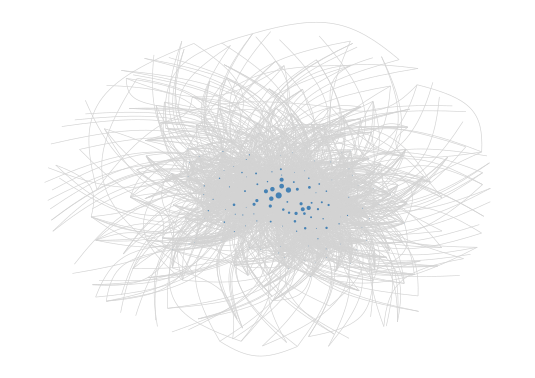

In [62]:
layout= x -> spring_layout(x; C=20)
gplot(G, layout = layout,
        nodefillc = colorant"steelblue",
        linetype = "curve",
        nodesize = PageRank[:,:rank]
)

We can se that the pagerank is concentrated on a few airports.

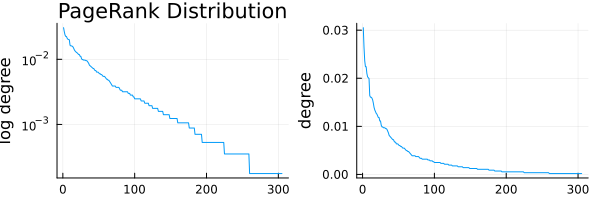

In [63]:
p1 = plot(PageRank_sorted[:,:rank], ylabel="log degree", legend=false, yaxis=:log, title="PageRank Distribution")
p2 = plot(PageRank_sorted[:,:rank], ylabel="degree", legend=false)
plot(p1, p2, size=(600,200))

The second visualization is as follows:

In [ ]:
P2 = @vlplot(width=800, height=500) +
@vlplot(
    mark={:geoshape, fill=:white, stroke=:lightgray},
    data={values=us10m, format={type=:topojson,feature=:states}},
    projection={type=:albersUsa}) +
@vlplot(
    :circle,
    data=PageRank, projection={type=:albersUsa}, 
    longitude="longitude:q", latitude="latitude:q", 
    size="rank", color={value=:steelblue})

## 5. Further Exercises

(1) The file 'users_hashtags.txt' contains Twitter data structured like this: the first entry in every block of lines is the author of the tweet, while the other entries are the hashtags used in that tweet. Different blocks are separated by empty lines. Using 'Julia', build a network int eh follow way:

Vertices are (unique) users and (unique) hastags; the user $U$ and the hashtag $H$ are connected by an edge if and only if a tweet by $U$ contains $H$. There are no edges between any two users or any two hashtags (in particular the network is a bipartite graph).

After removing vertices of degree zero, compute the specturm of the Laplacian of the graph. Explain the meaning of the spectrum.

(2) Implement in Julia the algorithm described in Exercise 2.44 of the notes `Mathdata` for the graph with vertex set {1, 2, 3} and
edge set {{1, 2}, {1, 3}}, using 4 colors. Use this to estimate the number of admissible 4-colorings of the graph (idea:
start from a random - not necessarily admissible! - coloring, walk for a certain fixed number of steps, record the final
coloring; run the process 1000 times. How many times do you see each coloring?)

(3) 

(a) Given a connected graph, write a Julia function that computes the distance between two vertices.

(b) Write functions that compute betweenness, closeness, degree and harmonic centralities for a connected graph.

(c) Write a function that takes as inputs a connected graph and a type of centrality measure and returns the most
important vertices with respect to that measure.


(d) Use the function from (c) to investigate some connected graphs with 10 vertices and 18 edges. Then do the same
with the Krackhardt kite graph (see the Wikipedia entry).

Hint: Some useful commands from the Graphs package are degree, adjacency_matrix and SimpleGraph.